This notebook is made for "Data Analysis for Genomics Workshop" (DAGWS). 
Tran Bich Ngoc CAO, ENS Paris, August 2020.
<a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/"><img alt="Licence Creative Commons" style="border-width:0" src="https://i.creativecommons.org/l/by-nc-sa/4.0/88x31.png" /></a><br /> This work is protected by the term of <a rel="license" href="http://creativecommons.org/licenses/by-nc-sa/4.0/">Licence Creative Commons Attribution - NonCommercial-ShareAlike 4.0 International </a>. Please cite the source in case of re-distribution.

<img src="fig/meme.png" width="300">

# Supervised learning: Classification 


In this excercise, we will explore the breast cancer wisconsin dataset with toolkit from scikit-learn for classification. When do we need to classify? What type of data? (continuous or categorical)

We will see together step by step, don't you worry! 

- First, import the load_breast_cancer function from sklearn.datasets. Then load the data and assign it to 'brcc'. Tip! always try to choose a explicit name, short but meaningful for each variable! 

In [2]:
from sklearn.datasets import load_breast_cancer

In [3]:
brcc = load_breast_cancer()

- Now print the type of 'brcc'

In [4]:
print(type(brcc))

<class 'sklearn.utils.Bunch'>


A "Bunch" object is indeed a dictionary, containing 'key' and 'value'. Remind: an example of dictionary: 

``` fruit = {'banana':'banane'; 'apple' : 'pomme'} ``` where 'banana' and 'apple' are keys, 'banane' and 'pomme' are values

- Let's print the keys of this dictionary

In [5]:
print(brcc.keys())

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])


- Now, you can access any key, try 'data', 'target', 'DESCR' (description of the data) and all the other keys :)

In [6]:
print(brcc.target_names)

['malignant' 'benign']


In [7]:
print(brcc.data)

[[1.799e+01 1.038e+01 1.228e+02 ... 2.654e-01 4.601e-01 1.189e-01]
 [2.057e+01 1.777e+01 1.329e+02 ... 1.860e-01 2.750e-01 8.902e-02]
 [1.969e+01 2.125e+01 1.300e+02 ... 2.430e-01 3.613e-01 8.758e-02]
 ...
 [1.660e+01 2.808e+01 1.083e+02 ... 1.418e-01 2.218e-01 7.820e-02]
 [2.060e+01 2.933e+01 1.401e+02 ... 2.650e-01 4.087e-01 1.240e-01]
 [7.760e+00 2.454e+01 4.792e+01 ... 0.000e+00 2.871e-01 7.039e-02]]


In [8]:
print(brcc.target)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 1 1 1 1 1 0 0 1 0 0 1 1 1 1 0 1 0 0 1 1 1 1 0 1 0 0
 1 0 1 0 0 1 1 1 0 0 1 0 0 0 1 1 1 0 1 1 0 0 1 1 1 0 0 1 1 1 1 0 1 1 0 1 1
 1 1 1 1 1 1 0 0 0 1 0 0 1 1 1 0 0 1 0 1 0 0 1 0 0 1 1 0 1 1 0 1 1 1 1 0 1
 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 0 1 1 0 0 1 1 0 0 1 1 1 1 0 1 1 0 0 0 1 0
 1 0 1 1 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 1 1 0 1 0 0 0 0 1 1 0 0 1 1
 1 0 1 1 1 1 1 0 0 1 1 0 1 1 0 0 1 0 1 1 1 1 0 1 1 1 1 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 1 1 1 1 0 1 0 1 1 0 1 1 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1
 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1 1 1 0 0 0 1 1
 1 1 0 1 0 1 0 1 1 1 0 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 0 0 1 0 0
 0 1 0 0 1 1 1 1 1 0 1 1 1 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 1 1 1 1 1
 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 1 1 1 1 1 0 1 1
 0 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1
 1 1 1 1 1 1 0 1 0 1 1 0 

In [9]:
print(brcc.DESCR)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [10]:
print(brcc.feature_names)

['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave points' 'worst symmetry' 'worst fractal dimension']


With this "Bunch" object, we can transform it into a common data type: Pandas `Dataframe`, which is much nicer and easier to manipulate!

- Import `pandas` library as `pd` (conventional)
- Read the data in `brcc` by `DataFrame` method of pandas, specify columns as `feature_names` of assign the DataFrame to `brcc_df`
- Have a look at the head of the `brcc_df` by its method `head()` and the shape of the DF by method `shape()`

In [11]:
import pandas as pd

In [12]:
brcc_df = pd.DataFrame(brcc.data,columns=brcc.feature_names)

In [13]:
brcc_df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [14]:
brcc_df.shape

(569, 30)

As you have seen, Pandas `DataFrame` is much better for visualization! You will see later how easily it is to manipulate such df :)

Our task is quite straightforward: from all the physical measuments or 'features' of the tumors (concavity, smoothness, area, perimeter,...), whether each tumor is 'benign' or 'malignant', we want to build a model that can classify a new tumor as 1 - 'benign' or 0 - 'malignant'. In other words, we teach our machine to learn about how a benign or malignant tumor looks like, and it will perform prediction for the new sample! How powerful is that!

- The above table of `brcc_df` is called a `feature matrix`. Now create a `Target` Series that contains the information of malignancy in the `target` key of `brcc_df`. To make a pandas Series (by passing the Numpy array, a Series is a one-dimensional labeled array and thus make it easier to handle with labels) and assign it to `brcc_tg`, specify the datatype `dtype` as 'category'
- print the end of `brcc_tg` with method `tail()` of the Series
- Get the length of the Series and see how many benign tumors by method `describe` of the Series

In [ ]:
brcc_tg = pd.Series(brcc.target,name='Target',dtype='category')

In [28]:
print(brcc_tg.tail())

564    0.0
565    0.0
566    0.0
567    0.0
568    1.0
Name: Target, dtype: float64


In [29]:
brcc_tg.describe()

count    569.000000
mean       0.627417
std        0.483918
min        0.000000
25%        0.000000
50%        1.000000
75%        1.000000
max        1.000000
Name: Target, dtype: float64

Great! You see that the Series has a length of 569, equal number of columns of the DataFrame. We have 569 tumor samples, and 30 characteristics that describe it. Now you will perform EDA (Exploratory Data Analysis) to get a better look at the data.

### Exploratory Data Analysis (EDA)

This step is very important in any type of analysis to grasp the feeling of the structure of data, the relationship between features... in order to choose model and approximate a parameter/hyperparameter later. Even it's just a prelinary step, it is worthy, so don't skip it :)

We already see the shape of the data. Let's see some statistics!
- use info() method to see datatype of the feature, to get statistics, use describe() method

In [30]:

brcc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 30 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [31]:
brcc_df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


Now let's do some visualized EDA! It is already made for you

In [32]:
import seaborn as sns

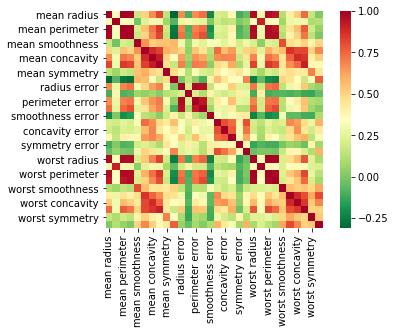

In [33]:
sns.heatmap(brcc_df.corr(),square=True, cmap='RdYlGn_r')

What do you see about the correlation among features?

In [45]:
#pd.plotting.scatter_matrix(brcc_df.iloc[:,:], c=brcc_tg, figsize=[80,80], s=150, marker='D')

Ooops! A lot of scrolling ! Try this :P Notice the ';' at the end

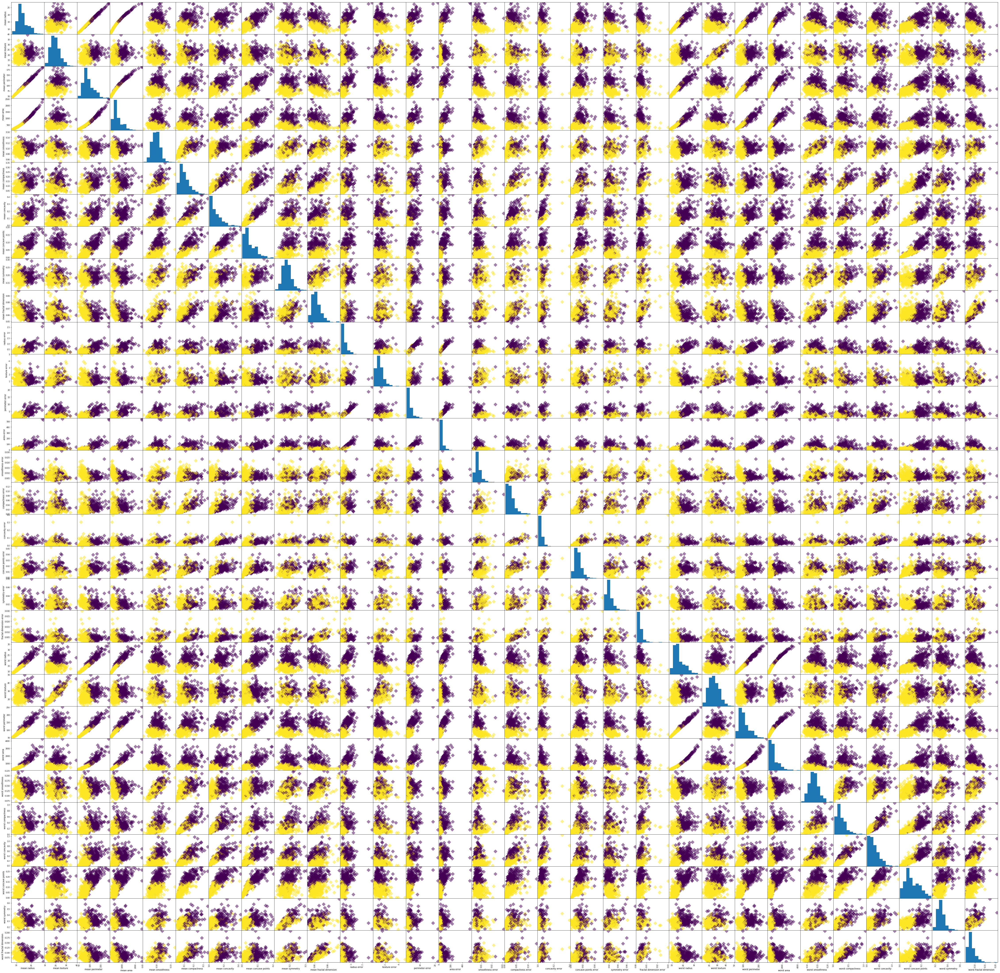

In [44]:
%matplotlib inline 
pd.plotting.scatter_matrix(brcc_df.iloc[:,:], c=brcc_tg, figsize=[80,80], s=150, marker='D');

The diagonal shows the histogram for each feature, and the rest plots are correlation coefficient of the pairs of feature, which is labeled by 'target' - malignant or benign tumor. We got a lot of information already from this plot! See some cluster and linear relationship! As we have more than 30 features, to see better you can subset the df. It's your turn!

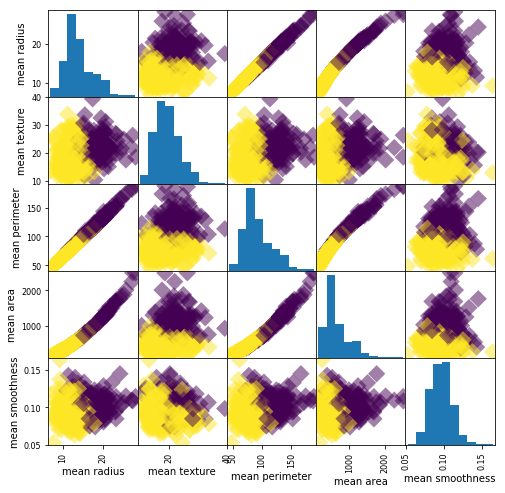

In [49]:
pd.plotting.scatter_matrix(brcc_df.iloc[:,0:5], c=brcc_tg, figsize=[8,8
                                                                   ], s=150, marker='D');

Of course mean perimeter is linear corelated to mean radius, and we see that tumors are clustered as malignant or benign!

Histogram shows us that features are normally distributed but many skewed to the left.

_Note: If you get the error "AttributeError: module 'pandas' has no attribute 'plotting'", \\
    go back to your terminal and type `pip install plotting` or check your pandas version, we are using pandas 1.1.0, ensure `pip install --upgrade pandas` if you got an old version._
    
    You can also use sns.pairplot() to have the same results

# Supervised Learning with KNN

### K-Neighbor Classification (KNN)

The first algorithm we will get acquainted with is KNN.

The K-means algorithm consists of dividing the points into clusters so as to minimize a certain function. We consider the distance of a point from the average of the points of its cluster; the function to be minimized is the sum of the squares of these distances. The algorithm continues iteratively where each iteration consists of two steps: * expectation * (E) and * maximization * (M). Here is the sequence of the algorithm:

- Initialize centers randomly

Iterations until convergence (or max # iterations, or criteria on the variance ...):
- E: Assign each point to the nearest cluster, minimizing the sum of the squares of the distances
- M: Assign the centers of each cluster to the average of these points. We thus maximize the likelihood of the points of each cluster found in step E

< img src="fig/

#### Construct the classifier

- Import the Classifier as a Class from the API
- Instantiate the Classifier and assign it as KNN variable, specify number of neighbors n_neighbors=2. We will talk about choosing this parameter later.
- Now we have the Classifier, lets fit it on the dataframe and the target, in other words, let the model learn about the brcc_df and brcc_tg implicitly, without actually modify anything.
- After fitting, use the predict() medthod on brcc_df to create new labels target, print it.

In [81]:
from sklearn.neighbors import KNeighborsClassifier

In [113]:
KNN = KNeighborsClassifier(n_neighbors=2)

In [114]:
KNN.fit(brcc_df,brcc_tg)

KNeighborsClassifier(n_neighbors=2)

In [115]:
pred = KNN.predict(brcc_df)

In [116]:
print("Prediction: {}".format(pred))


Prediction: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 1 1 1 1 1 0 0 1 0 0 1 1 1 1 0 1 0 0 1 1 1 1 0 1 0 0
 1 0 1 0 0 1 1 1 0 0 1 0 0 0 1 1 1 0 0 1 0 0 1 1 1 0 0 1 1 1 1 0 1 1 0 1 1
 1 0 1 1 0 1 0 0 0 1 0 0 1 1 1 0 0 0 0 1 0 0 0 0 0 1 1 0 1 1 0 1 1 1 1 0 1
 1 1 1 1 1 1 1 1 0 1 1 1 1 0 0 1 0 1 1 0 0 1 1 0 0 1 1 1 1 0 1 1 0 0 0 1 0
 1 0 1 1 1 0 1 1 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 1 0 0 1 0 0 0 0 1 1 0 0 1 1
 1 0 1 1 1 1 1 0 0 1 1 0 1 1 0 0 0 0 1 1 1 1 0 1 1 1 1 1 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 1 1 1 1 1 1 0 1 0 1 1 0 1 1 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1
 1 0 0 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 1 0 1 1 1 1 0 0 0 1 1
 1 1 0 1 0 1 0 1 1 1 0 1 1 1 1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 0
 0 0 0 0 1 0 1 1 1 0 1 1 1 1 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 1 0 1 1 1 1 1 0
 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 0 1 0 1 1 1 1 1 0 1 1
 0 1 0 1 1 0 1 0 1 1 1 1 1 1 1 1 0 0 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 0 1
 0 1 1 0 1 1 

How good is our model? 
- Import accuracy_score from sklearn.metrics
- Calculate accuracy from the predicted labels and the target.
Recall:
Accuracy = Fraction of correct prediction
            = ( TP + TN)/(TP + TN + FP + FN)

In [117]:
from sklearn.metrics import accuracy_score

In [118]:
accuracy_score(pred, brcc_tg)

0.968365553602812

It is not bad! But did you realize that we are using the same INPUT for our model to learn and making prediction on the same set?! Our model knows the data so well that the accuracy is so high, what if we change to a complete new set? Can it fail?

#### Train Test Splitting

In [119]:
from sklearn.model_selection import train_test_split

In [121]:
X_train, X_test, y_train, y_test = train_test_split(brcc_df, brcc_tg, test_size = 0.2, random_state=20, stratify=brcc_tg)
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train,y_train)
print(knn.score(X_test, y_test))
knn = sklearn.model_

0.9122807017543859


##### Model Complexity and Accuracy Trade-off

<img src="fig/knn_complex.png" width=600>

Symptom of overfitting: Training performance = very good, testing performance = bad

Explanation 1: Complicated model on simple data: fitting to noise

Explanation 2: Too much weight on local variations / neighbourhood

In [123]:
import numpy as np

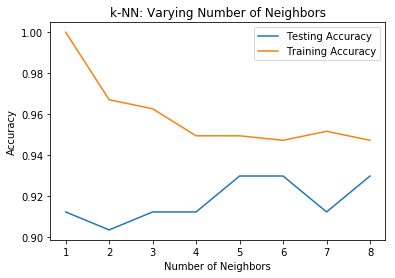

In [124]:
# Setup arrays to store train and test accuracies
neighbors = np.arange(1, 9)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

# Loop over different values of k
for i, k in enumerate(neighbors):
    # Setup a k-NN Classifier with k neighbors: knn
    knn = KNeighborsClassifier(n_neighbors=k)

    # Fit the classifier to the training data
    knn.fit(X_train,y_train)
    
    #Compute accuracy on the training set
    train_accuracy[i] = knn.score(X_train,y_train)

    #Compute accuracy on the testing set
    test_accuracy[i] = knn.score(X_test, y_test)

# Generate plot
plt.title('k-NN: Varying Number of Neighbors')
plt.plot(neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training Accuracy')
plt.legend()
plt.xlabel('Number of Neighbors')
plt.ylabel('Accuracy')
plt.show()

Hurray!! Congratulations! You made it here ! :)

You have learnt about tuning a __parameter__ to maximize the performance of your model. Given a new set of physical characteristics of tumor with unknown state of malignancy, now we can be sure about 93% which tumors are benign that maybe get an surgical operation!

#### Cross validation

<img src="fig/CV.png" width=500>

vvv

- Import the necessary modules `cross_val_score` from `sklearn.model_selection` and `KNeighborsClassifier` from `sklearn.neighbor`
- Instantiate a KNN object call `KNN`
- Compute 5-fold cross-validation scores and store it in cv_scores variable using `cross_val_score` function with `KNN` as the statistical model, `brcc_df` as dataset, `brcc_tg` for target and specify number of folds `cv` is 5.
- Print the CV score mean from the list of scores



In [130]:
import numpy as np
# Import the necessary modules
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier

# Create a linear regression object: reg
KNN = KNeighborsClassifier()

# Compute 5-fold cross-validation scores: cv_scores
cv_scores = cross_val_score(KNN,brcc_df,brcc_tg,cv=5)

# Print the 5-fold cross-validation scores
print(cv_scores)

print("Average 5-Fold CV Score: {}".format(np.mean(cv_scores)))

[0.88596491 0.93859649 0.93859649 0.94736842 0.92920354]
Average 5-Fold CV Score: 0.9279459711224964


- Now try to split the data AND do cross validation! This is ???

You have dealed with a binary target (0 and 1). In fact, it is better to use a `Binary Classifier`

In the next excercise, you will try another aspect of Supervised Classification: Logistic Regression. Don't let it fool you, here it's not regression but Classification of binary ...

## Additional information
